# **Neural Style Transfer with InceptionV3**

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm

from IPython.display import display as display_fn
from IPython.display import Image, clear_output

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm

from IPython.display import display as display_fn
from IPython.display import Image, clear_output


def tensor_to_image(tensor):
  tensor_shape = tf.shape(tensor)
  number_elem_shape = tf.shape(tensor_shape)
  if number_elem_shape > 3:
    assert tensor_shape[0] == 1
    tensor = tensor[0]
  return tf.keras.preprocessing.image.array_to_img(tensor)


def load_img(path_to_img):
  max_dim = 512
  image = tf.io.read_file(path_to_img)
  image = tf.image.decode_jpeg(image)
  image = tf.image.convert_image_dtype(image, tf.float32)
  shape = tf.shape(image)[:-1]
  shape = tf.cast(tf.shape(image)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim
  new_shape = tf.cast(shape * scale, tf.int32)
  image = tf.image.resize(image, new_shape)
  image = image[tf.newaxis, :]
  image = tf.image.convert_image_dtype(image, tf.uint8)

  return image


def show_images(images, titles=[]):
  plt.figure(figsize=(20, 12))
  for idx, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1, len(images), idx + 1)
    plt.xticks([])
    plt.yticks([])

    if len(image.shape) > 3:
      image = tf.squeeze(image, axis=0)
    plt.imshow(image)
    plt.title(title)

def preprocess_image(image):
  image = tf.cast(image, dtype=tf.float32)
  image = (image / 127.5) - 1.0

  return image

In [ ]:
# Choosing earlier layers for extracting style features
style_layers = ['conv2d',
                'conv2d_1',
                'conv2d_2',
                'conv2d_3',
                'conv2d_4',
                'conv2d_7',
                'conv2d_9',
                ]
content_layers = ['conv2d_88'] # Choosing deeper layer for extracting content features
content_and_style_layers = style_layers + content_layers

NUM_CONTENT_LAYERS = len(content_layers)
NUM_STYLE_LAYERS = len(style_layers)


def inception_model(layer_names):
  inception = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
  inception.trainable = False
  outputs = [inception.get_layer(name).output for name in layer_names]
  model = tf.keras.Model(inputs=inception.input, outputs=outputs)
  return model

inceptionv3 = inception_model(content_and_style_layers)
inceptionv3.summary()

87910968/87910968 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     

In [ ]:
# モデルの重みを保存
inceptionv3.save_weights('/content/inceptionv3.h5')

In [ ]:
def get_style_loss(features, targets):
  style_loss = tf.reduce_mean(tf.square(features - targets))
  return style_loss


def get_content_loss(features, targets):
  content_loss = 0.5 * tf.reduce_sum(tf.square(features - targets))
  return content_loss


def gram_matrix(input_tensor):
  gram = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)

  input_shape = tf.shape(input_tensor)
  height = input_shape[1]
  width = input_shape[2]
  num_locations = tf.cast(height * width, tf.float32)
  scaled_gram = gram / num_locations

  return scaled_gram


def get_style_image_features(image):
  outputs = inceptionv3(preprocess_image(image))
  style_outputs = outputs[:NUM_STYLE_LAYERS]
  gram_style_features = [gram_matrix(style_layer) for style_layer in style_outputs] # Gram Matrix for each style layer

  return gram_style_features


def get_content_image_features(image):
  outputs = inceptionv3(preprocess_image(image))
  content_outputs = outputs[NUM_STYLE_LAYERS:]

  return content_outputs


def get_style_content_loss(style_targets, style_outputs, content_targets,
                           content_outputs, style_weight, content_weight):

  style_loss = tf.add_n([ get_style_loss(style_output, style_target)
                           for style_output, style_target in zip(style_outputs, style_targets)])
  content_loss = tf.add_n([get_content_loss(content_output, content_target)
                           for content_output, content_target in zip(content_outputs, content_targets)])

  style_loss = style_loss * style_weight / NUM_STYLE_LAYERS
  content_loss = content_weight * content_loss / NUM_CONTENT_LAYERS
  total_loss = style_loss + content_loss

  return total_loss


In [ ]:
def calculate_gradients(image, style_targets, content_targets,
                        style_weight, content_weight, var_weight=0):

  with tf.GradientTape() as tape:
    style_features = get_style_image_features(image)
    content_features = get_content_image_features(image)
    loss = get_style_content_loss(style_targets, style_features, content_targets, content_features, style_weight, content_weight)
    loss += var_weight*tf.image.total_variation(image)     # Total variation Loss

  gradients = tape.gradient(loss, image)

  return gradients


def update_image_with_style(image, style_targets, content_targets, style_weight,
                            var_weight, content_weight, optimizer):

  gradients = calculate_gradients(image, style_targets, content_targets, style_weight, content_weight, var_weight)
  optimizer.apply_gradients([(gradients, image)])
  image.assign(tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=255.0))

In [ ]:
def plot_loss_curve(losses):
    plt.figure(figsize=(10, 5))
    plt.plot(losses, label='Loss')
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Loss over iterations')
    plt.legend()
    plt.show()

In [ ]:
# Function to perform style transfer by iteratively updating the content image to match the style of the style image
def fit_style_transfer(style_image, content_image, style_weight=1e-2, content_weight=1e-4, var_weight=0, optimizer='adam', epochs=1, steps_per_epoch=1, show_transition=False, plot_losses=False):
    images = []  # List to store intermediate images
    losses = []  # List to store loss values
    step = 0  # Step counter

    # Extract style and content features from the style and content images
    style_targets = get_style_image_features(style_image)
    content_targets = get_content_image_features(content_image)

    # Initialize the generated image with the content image
    generated_image = tf.cast(content_image, dtype=tf.float32)
    generated_image = tf.Variable(generated_image)

    images.append(content_image)  # Initial image is the original content image without any style

    # Iterate over epochs
    for n in range(epochs):
        # Iterate over steps in each epoch
        for m in tqdm(range(steps_per_epoch)):
            step += 1
            # Update the generated image with style
            update_image_with_style(generated_image, style_targets, content_targets, style_weight, var_weight, content_weight, optimizer)

            # Calculate the current loss
            current_loss = get_style_content_loss(style_targets, get_style_image_features(generated_image), content_targets, get_content_image_features(generated_image), style_weight, content_weight)
            current_loss += var_weight * tf.image.total_variation(generated_image)
            losses.append(current_loss.numpy())  # Append the current loss to the list

            # Append intermediate images at intervals of 10 steps
            if (m + 1) % 10 == 0:
                images.append(generated_image)

        # Optionally display the stylized image after each epoch
        if show_transition:
            display_fn(tensor_to_image(generated_image))

        images.append(generated_image)
        print(f"Train step: {step}")

    # Convert the final generated image to uint8 data type
    generated_image = tf.cast(generated_image, dtype=tf.uint8)

    # Optionally plot the losses after training
    if plot_losses:
        plot_loss_curve(losses)

    return generated_image, images, losses  # Return losses as well


In [45]:
def train(style_path,content_path):
  # Set the weights for style, content, and total variation losses
  EPOCHS = 3
  STEPS_PER_EPOCH =100
  STYLE_WEIGHT = 1e1
  CONTENT_WEIGHT = 1e-16
  VAR_WEIGHT = 0
  INITIAL_LEARNING_RATE = 80.0
  DECAY_STEPS = 100
  DECAY_RATE = 0.80

  # Load the content and style images
  content_image = load_img(content_path)
  style_image = load_img(style_path)

  # Define the Adam optimizer with exponential decay
  adam = tf.optimizers.Adam(
      tf.keras.optimizers.schedules.ExponentialDecay(
          initial_learning_rate=INITIAL_LEARNING_RATE, decay_steps=DECAY_STEPS, decay_rate=DECAY_RATE
      )
  )

  # Perform style transfer
  stylized_image_1, display_images_1, losses_1 = fit_style_transfer(
      style_image=style_image,
      content_image=content_image,
      style_weight=STYLE_WEIGHT,
      content_weight=CONTENT_WEIGHT,
      optimizer=adam,
      epochs=EPOCHS,  # Adjust the number of epochs as needed
      steps_per_epoch=STEPS_PER_EPOCH,  # Adjust the number of steps per epoch as needed
      var_weight=VAR_WEIGHT,  # Total variation loss
      show_transition=True,  # Show the stylized image after each epoch
      plot_losses=True  # Plot the losses after training
  )

  # Display the original and stylized images
  show_images([style_image, content_image, stylized_image_1], titles=['Style Image', 'Content Image', 'Stylized Image'])

  return

## From this point onwards, you can play with the code you have created. (The main implementation is already done)

  0%|          | 0/100 [00:00<?, ?it/s]

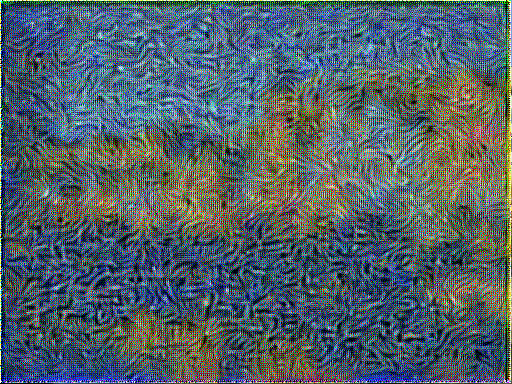

Train step: 100


  0%|          | 0/100 [00:00<?, ?it/s]

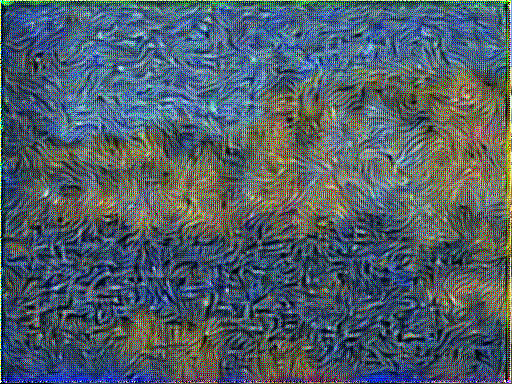

Train step: 200


  0%|          | 0/100 [00:00<?, ?it/s]

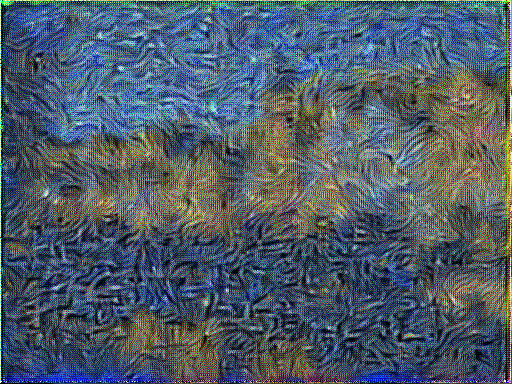

Train step: 300


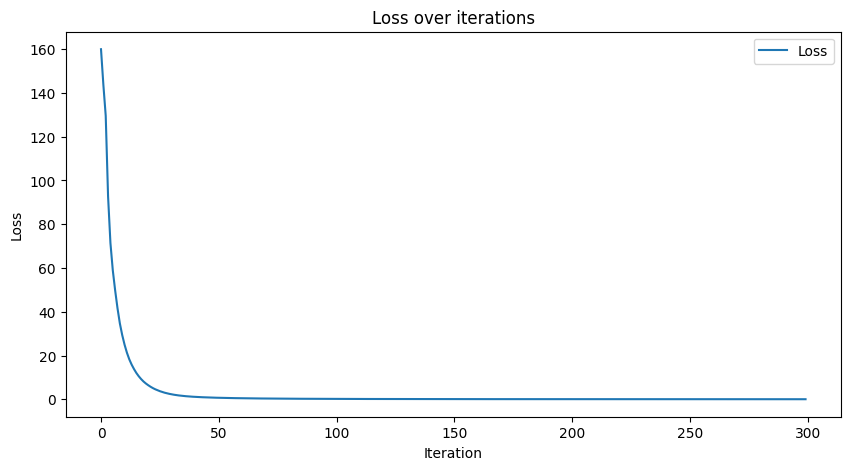

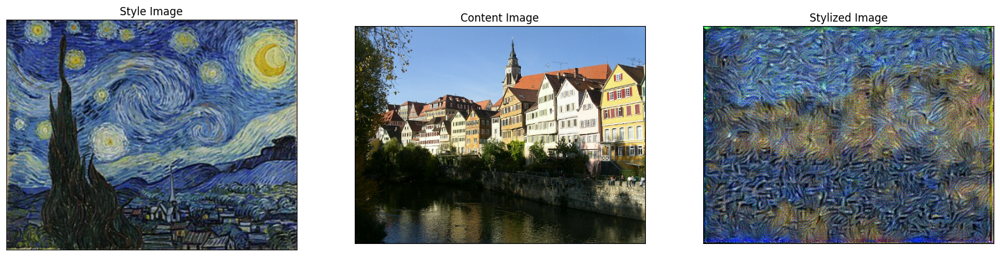

In [46]:
# Paths to the style and content images
style_path = '/content/The_starry_night.jpg'
content_path = '/content/Tübingen_Neckarfront_3.JPG'

# train
train(style_path,content_path)

  0%|          | 0/100 [00:00<?, ?it/s]

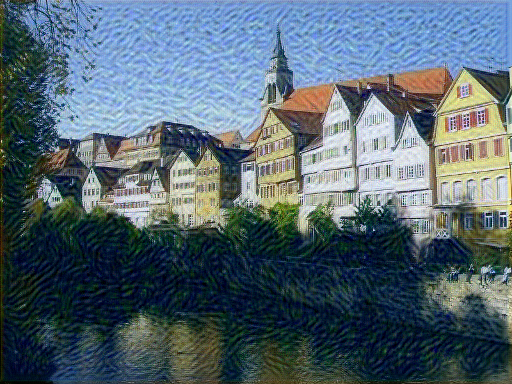

Train step: 100


  0%|          | 0/100 [00:00<?, ?it/s]

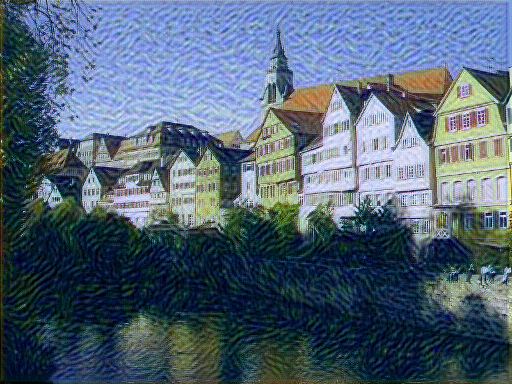

Train step: 200


  0%|          | 0/100 [00:00<?, ?it/s]

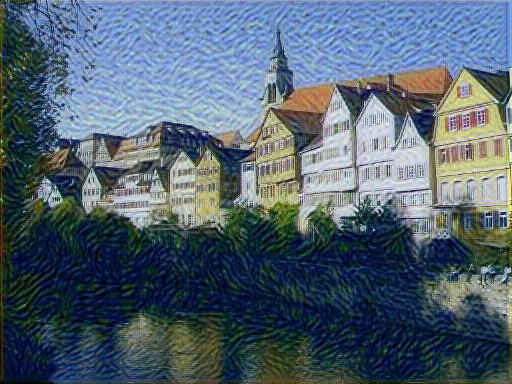

Train step: 300


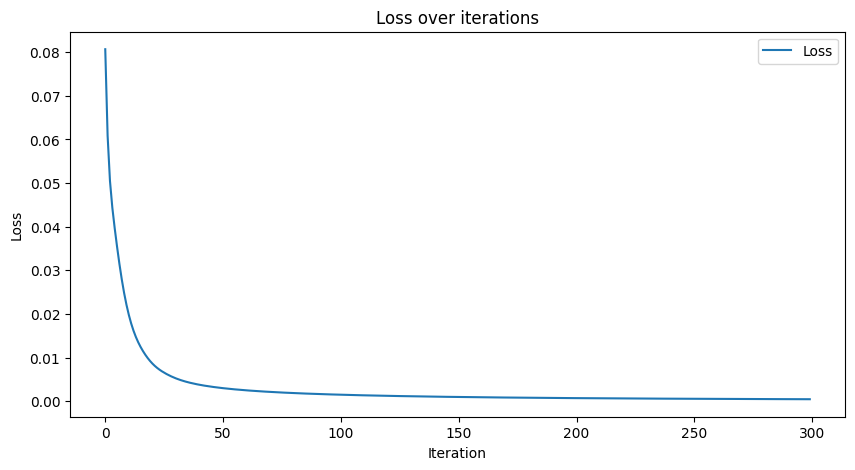

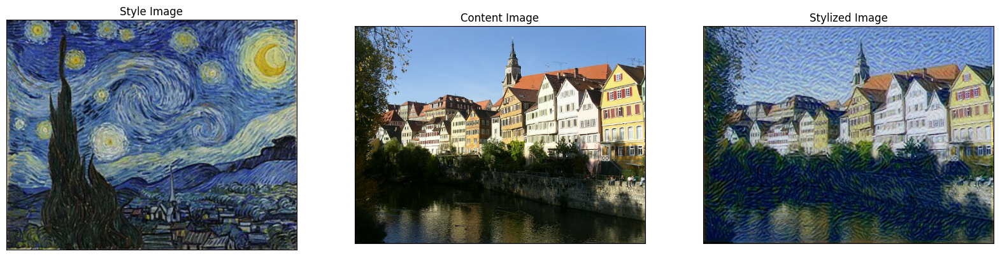

In [44]:
# # Paths to the style and content images(STYLE_WEIGHT changed)
# style_path = '/content/The_starry_night.jpg'
# content_path = '/content/Tübingen_Neckarfront_3.JPG'

# # train
# train(style_path,content_path)

  0%|          | 0/100 [00:00<?, ?it/s]

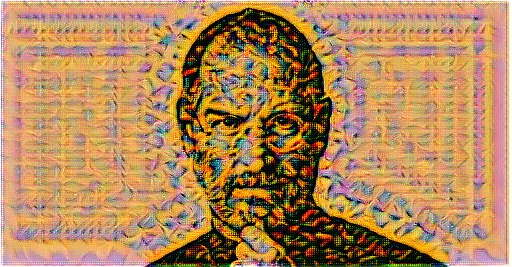

Train step: 100


  0%|          | 0/100 [00:00<?, ?it/s]

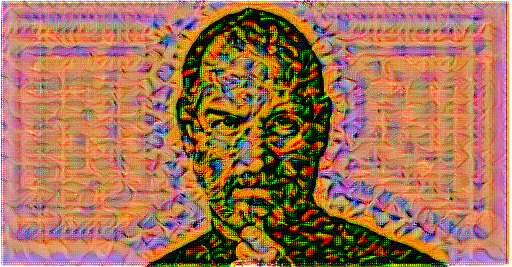

Train step: 200


  0%|          | 0/100 [00:00<?, ?it/s]

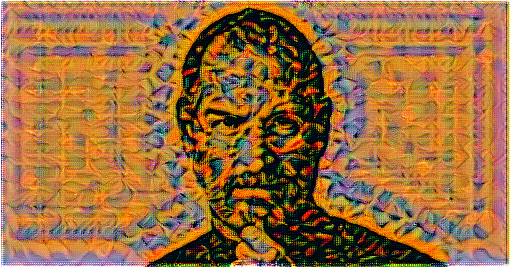

Train step: 300


  0%|          | 0/100 [00:00<?, ?it/s]

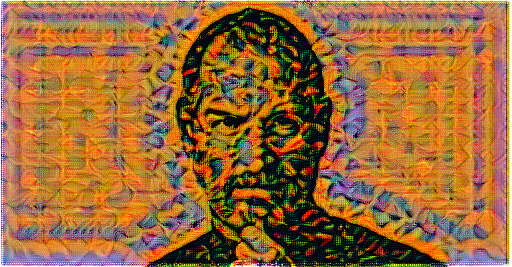

Train step: 400


  0%|          | 0/100 [00:00<?, ?it/s]

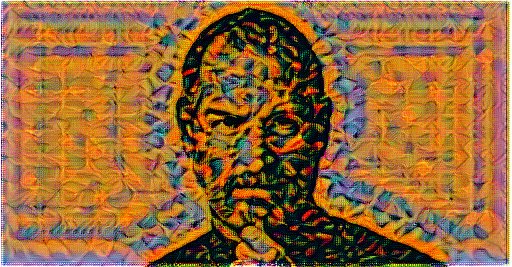

Train step: 500


  0%|          | 0/100 [00:00<?, ?it/s]

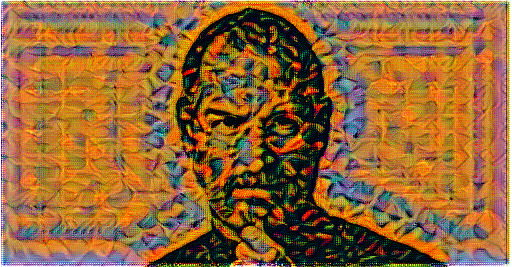

Train step: 600


  0%|          | 0/100 [00:00<?, ?it/s]

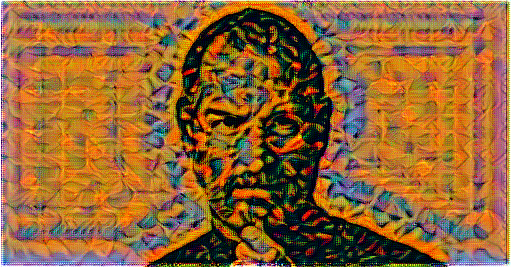

Train step: 700


  0%|          | 0/100 [00:00<?, ?it/s]

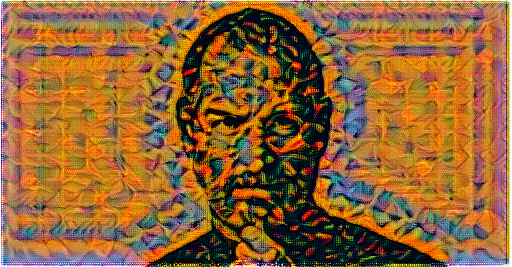

Train step: 800


  0%|          | 0/100 [00:00<?, ?it/s]

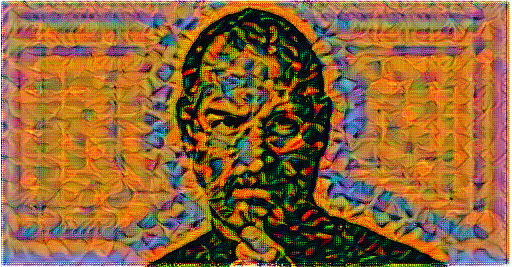

Train step: 900


  0%|          | 0/100 [00:00<?, ?it/s]

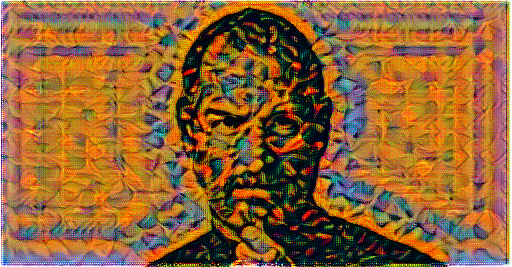

Train step: 1000


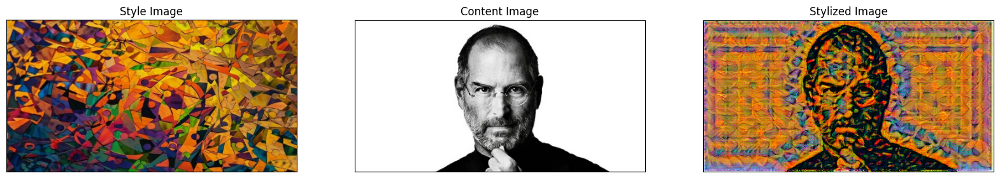

In [ ]:
# Paths to the style and content images
style_path = '/content/style2.jpeg'
content_path = '/content/Steve.jpeg'

# train
train(style_path,content_path)

In [40]:
# Load the content image
content_path = '/content/Tübingen_Neckarfront_3.JPG'
content_image = load_img(content_path)

# Convert the image to grayscale
gray_image = tf.image.rgb_to_grayscale(content_image)

# Remove the batch dimension
gray_image = tf.squeeze(gray_image, axis=0)

# Convert the grayscale image to uint8
gray_image = tf.image.convert_image_dtype(gray_image, tf.uint8)

# Save the grayscale image
gray_image_path = '/content/Tübingen_Neckarfront_3_gray.JPG'
tf.io.write_file(gray_image_path, tf.image.encode_jpeg(gray_image))

# Convert the grayscale image to RGB
rgb_image = tf.image.grayscale_to_rgb(gray_image)

# Save the RGB image
rgb_image_path = '/content/Tübingen_Neckarfront_3_rgb.JPG'
tf.io.write_file(rgb_image_path, tf.image.encode_jpeg(rgb_image))

  0%|          | 0/100 [00:00<?, ?it/s]

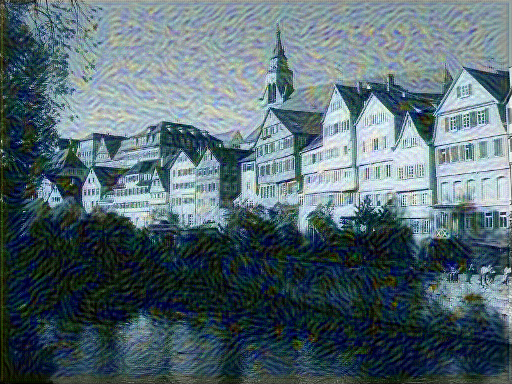

Train step: 100


  0%|          | 0/100 [00:00<?, ?it/s]

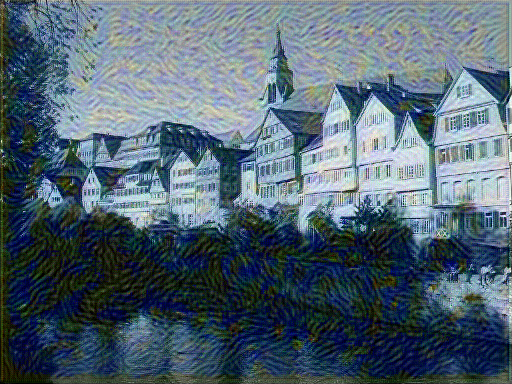

Train step: 200


  0%|          | 0/100 [00:00<?, ?it/s]

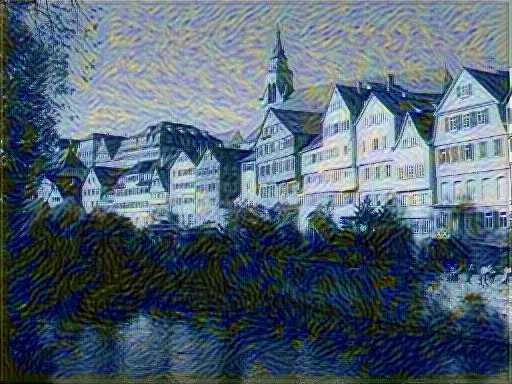

Train step: 300


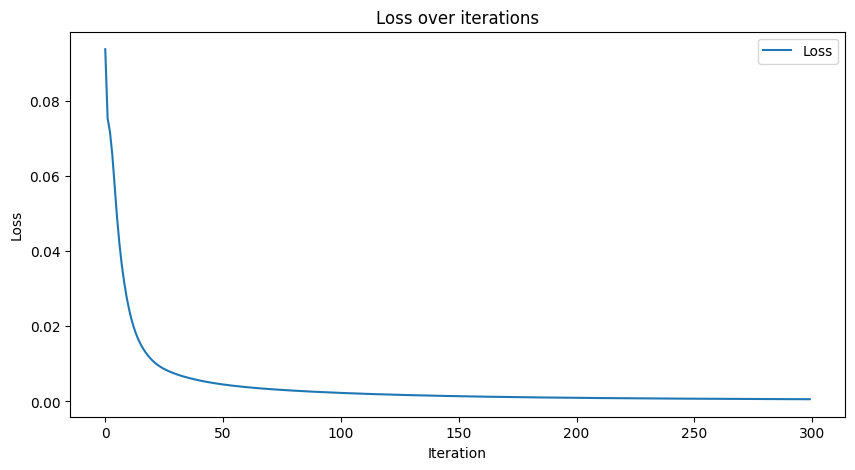

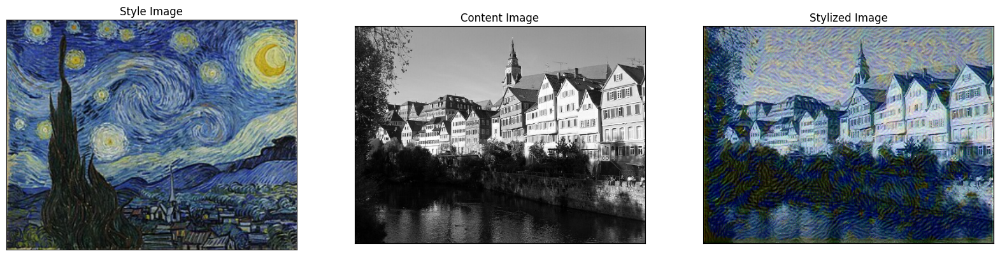

In [43]:
# Paths to the style and content images
style_path = '/content/The_starry_night.jpg'
content_path = '/content/Tübingen_Neckarfront_3_rgb.JPG'

# train
train(style_path,content_path)